# GeoBench PASTIS Panoptic

In [1]:
import os
from pathlib import Path

import torch

from geobench_v2.datamodules import GeoBenchPASTISPanopticDataModule
from geobench_v2.datasets import GeoBenchPASTIS
from geobench_v2.datasets.normalization import SatMAENormalizer, ZScoreNormalizer
from geobench_v2.datasets.visualization_util import (
    compute_batch_histograms,
    plot_batch_histograms,
    plot_channel_histograms,
    visualize_segmentation_target_statistics,
)

# %load_ext autoreload
# %autoreload 2

/opt/app-root/src/fm-geospatial/pf/envs/geo-env/lib64/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/app-root/src/fm-geospatial/pf/envs/geo-env/lib64/python3.11/site-packages/transformers/utils/generic.py:441: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(


In [3]:
PROJECT_ROOT = Path("../..")

In [4]:
band_order = GeoBenchPASTIS.band_default_order

datamodule = GeoBenchPASTISPanopticDataModule(
    img_size=256,
    batch_size=16,
    num_workers=4,
    root=PROJECT_ROOT,
    band_order=band_order,
    num_time_steps=4,
    data_normalizer=torch.nn.Identity(),
    download=True# we do custom normalization in the tutorial
)
datamodule.setup("fit")

Using provided pre-initialized normalizer instance: Identity
Using provided pre-initialized normalizer instance: Identity


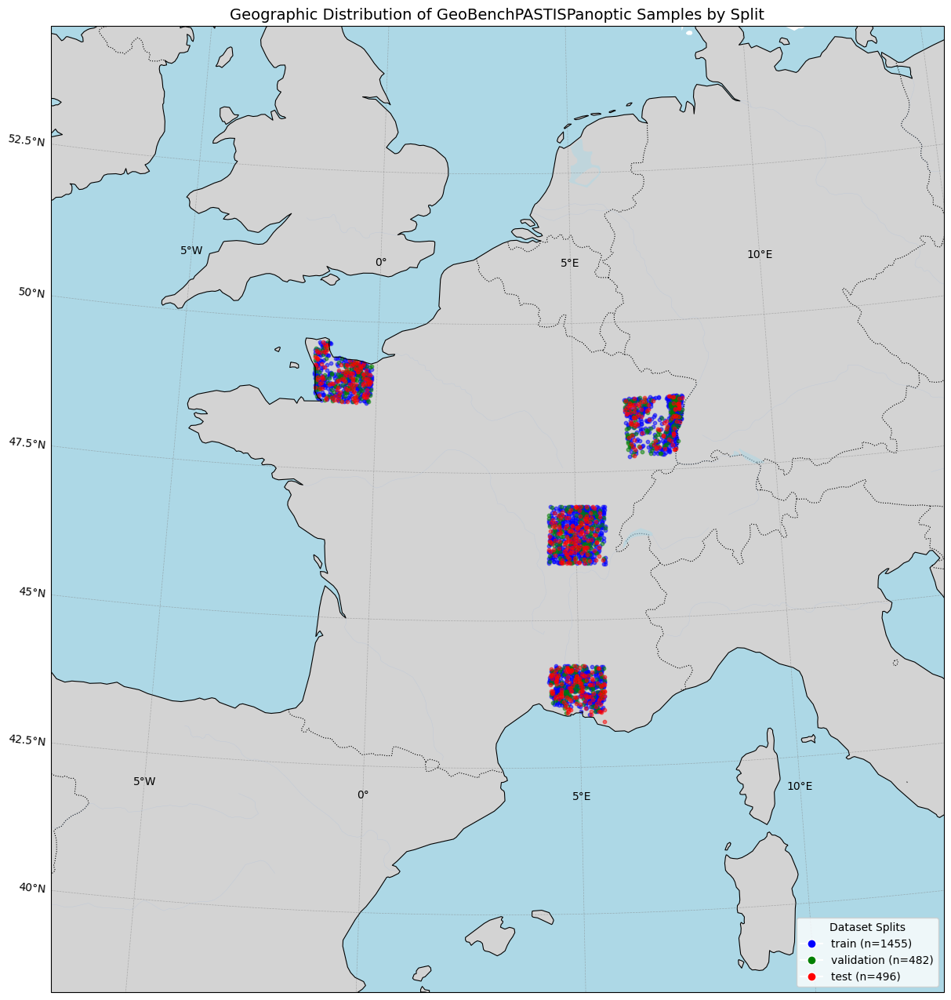

In [5]:
sample_dist_fig = datamodule.visualize_geospatial_distribution()

### Raw Image Statistics

Computed over the training dataset.

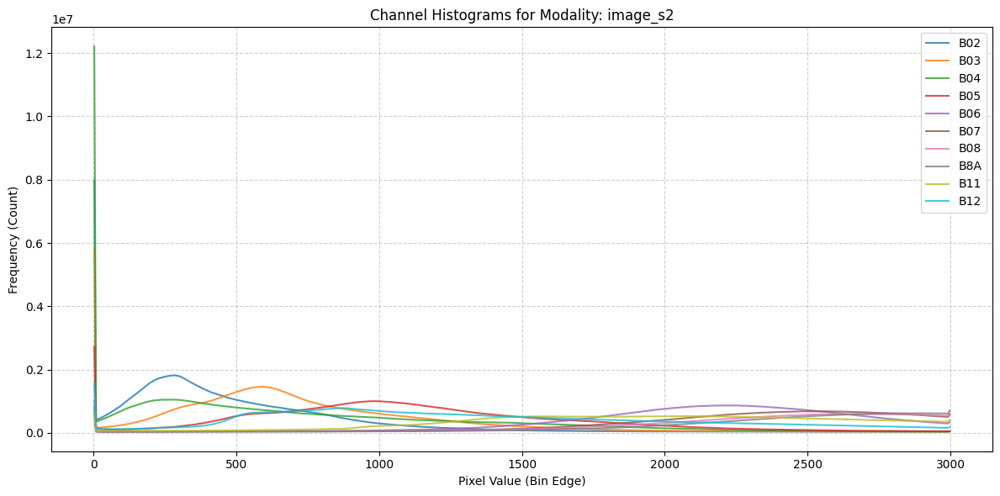

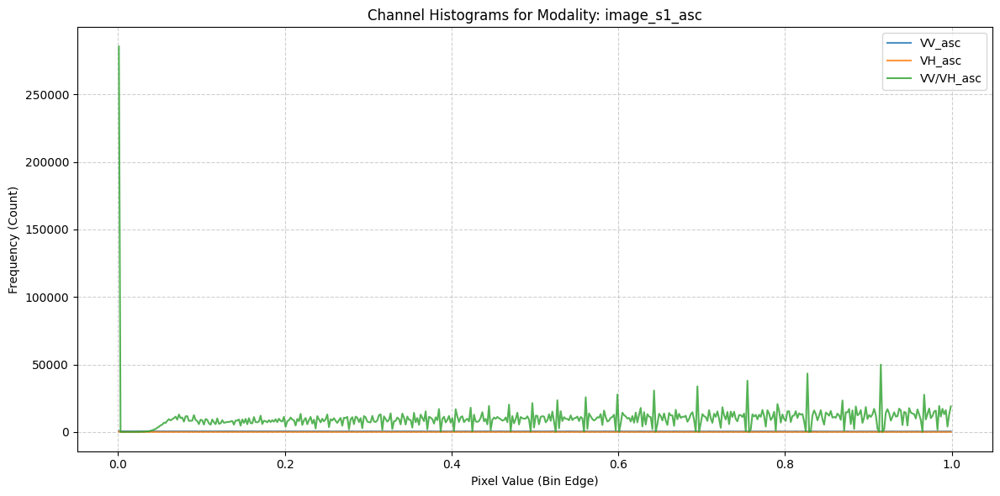

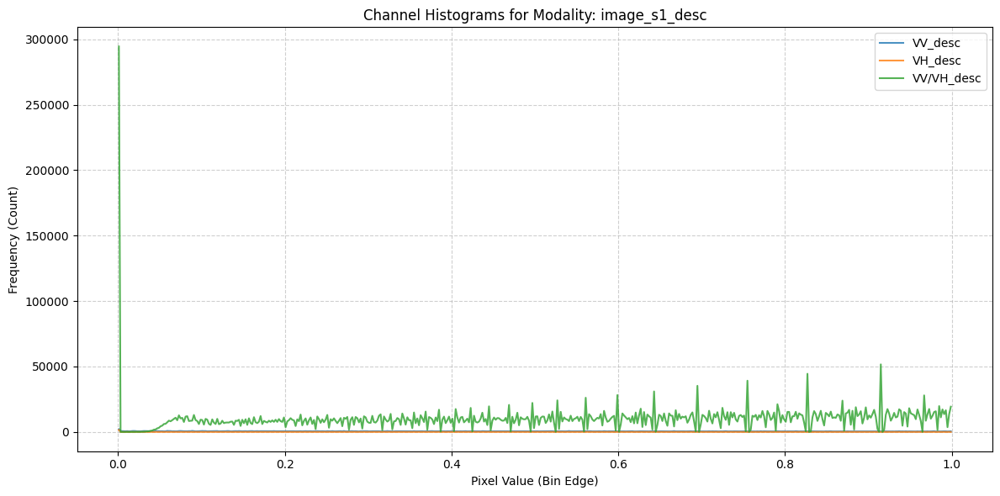

In [6]:
fig = plot_channel_histograms(PROJECT_ROOT / "geobench_v2" / "datamodules" / "dataset_stats_satmae" / "pastis"/"pastis_stats.json")

## Target Statistics

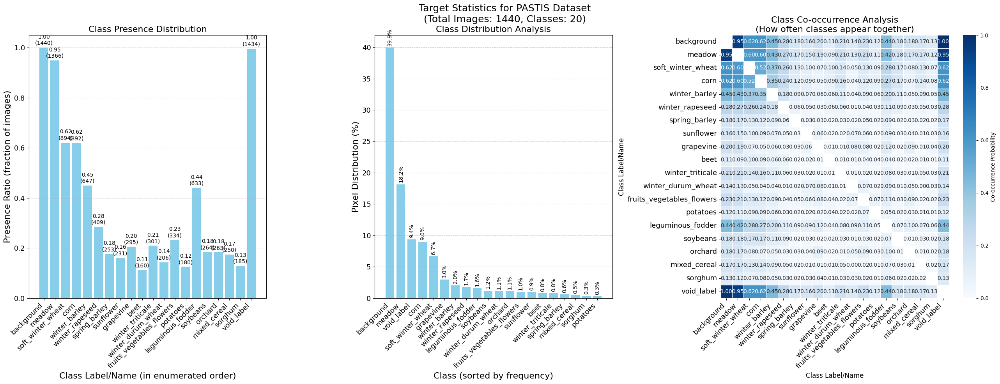

In [7]:
fig = visualize_segmentation_target_statistics(
    PROJECT_ROOT / "geobench_v2" / "datamodules" / "dataset_stats_satmae" / "pastis"/"pastis_stats.json", "PASTIS"
)

### Raw Batch Statistics

[<Figure size 1200x500 with 1 Axes>,
 <Figure size 1200x500 with 1 Axes>,
 <Figure size 1200x500 with 1 Axes>]

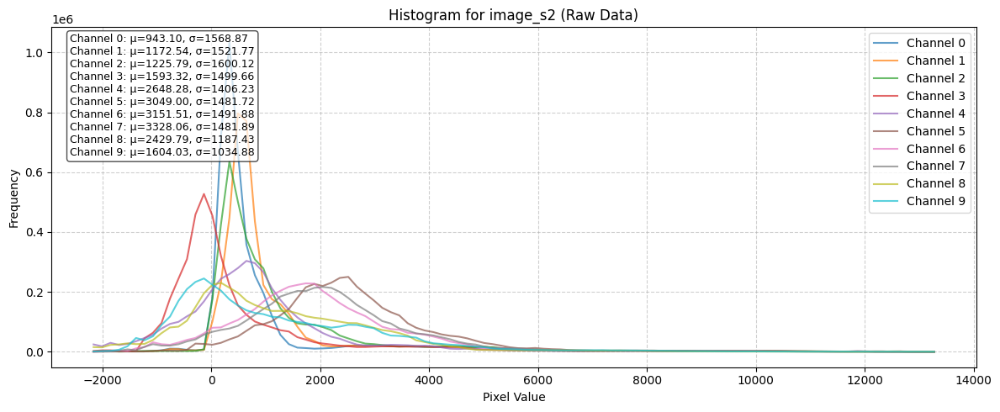

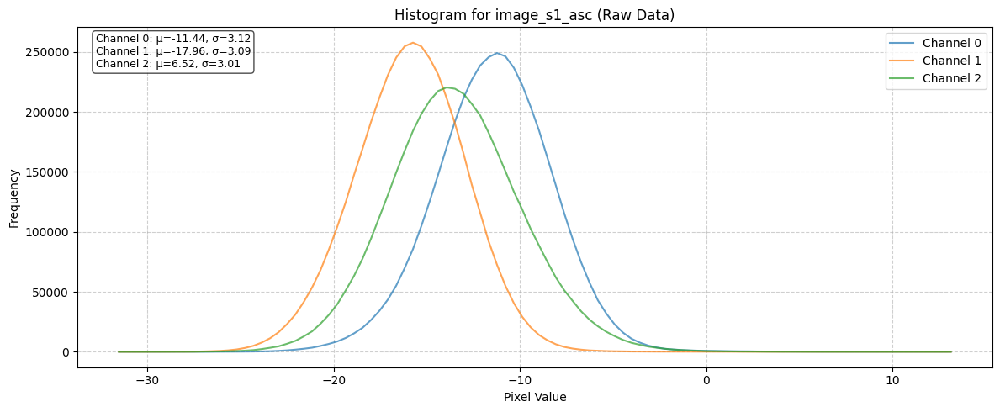

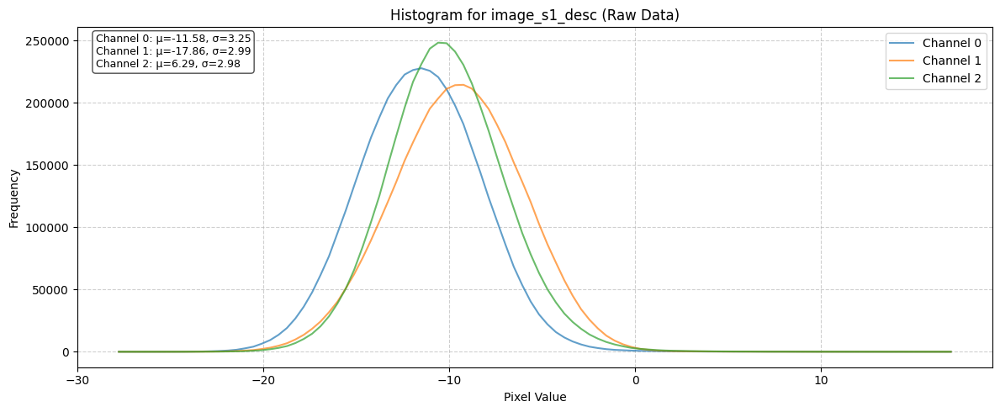

In [8]:
# Get a batch of data from the dataloader
train_dataloader = datamodule.train_dataloader()
raw_batch = next(iter(train_dataloader))

raw_batch_stats = compute_batch_histograms(raw_batch, n_bins=100)


raw_figs = plot_batch_histograms(
    raw_batch_stats, band_order, title_suffix=" (Raw Data)"
)
raw_figs

## Visualize Batch Data

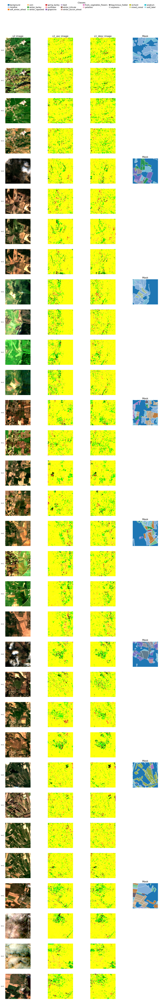

In [9]:
fig, batch = datamodule.visualize_batch()